# IMPORT LIBRARIES

In [1]:
import pandas as pd

In [2]:
import numpy as np

In [3]:
import seaborn as sns

In [4]:
import json

In [5]:
import sys


In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
from PyQt5.QtWidgets import (QMainWindow, QAction, qApp, QApplication, QPushButton, QDesktopWidget,
                            QLabel, QFileDialog, QWidget, QGridLayout, QMenu, QSizePolicy, QMessageBox, QWidget)

In [8]:
from PyQt5.QtGui import QIcon


In [9]:
from PyQt5.QtCore import QCoreApplication, Qt


In [10]:
import matplotlib.pyplot as plt


In [11]:
from matplotlib.backends.backend_qt5agg import FigureCanvasQTAgg as FigureCanvas


In [12]:
from matplotlib.figure import Figure


In [13]:
import numpy as np


In [14]:
import random


In [15]:
import pandas as pd


In [16]:
import numpy


In [17]:
from PyQt5.QtWidgets import QApplication


In [18]:
from PyQt5.QtWidgets import QLabel


In [19]:
from PyQt5.QtWidgets import QPushButton


In [20]:
from PyQt5.QtWidgets import QVBoxLayout


In [21]:
from PyQt5.QtWidgets import QWidget


In [22]:
from pandas import DataFrame


In [23]:
import json
CURRENT_VERSION = 0.1

## **LOAD THE DATASETS**

In [24]:
data_one = pd.read_csv("airport-frequencies.csv")
data_two = pd.read_csv("airports.csv")
data_three = pd.read_csv("runways.csv")

## **TO DISPLAY ALL ROWS AND COLUMNS**

In [25]:
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

In [26]:
#pd.options.display.max_columns = None
#pd.options.display.max_rows = None

## **PRINTING THE FIRST FEW ROWS OF ALL THREE DATASETS**

In [27]:
data_one.head()

,id,airport_ref,airport_ident,type,description,frequency_mhz
0,70518,6528,00CA,CTAF,CTAF,122.9
1,307581,6589,01FL,ARCAL,NaN,122.9
2,75239,6589,01FL,CTAF,CEDAR KNOLL TRAFFIC,122.8
3,60191,6756,04CA,CTAF,CTAF,122.9
4,59287,6779,04MS,UNIC,UNICOM,122.8


## **CHECKING THE COUNT OF THE TYPE COLUMN**

In [28]:
data_one["type"].value_counts()

TWR           3349
CTAF          3105
UNIC          2940
MISC          2223
APP           1835
              ... 
LEZG_APP         1
ILS - IEN        1
AFIS-TOWER       1
FCA              1
SUPP             1
Name: type, Length: 433, dtype: int64

In [29]:
data_two.head(5)

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,iso_country,iso_region,municipality,scheduled_service,gps_code,iata_code,local_code,home_link,wikipedia_link,keywords
0,6523,00A,heliport,Total Rf Heliport,40.070801,-74.933601,11.0,NaN,US,US-PA,Bensalem,no,00A,NaN,00A,NaN,NaN,NaN
1,323361,00AA,small_airport,Aero B Ranch Airport,38.704022,-101.473911,3435.0,NaN,US,US-KS,Leoti,no,00AA,NaN,00AA,NaN,NaN,NaN
2,6524,00AK,small_airport,Lowell Field,59.947733,-151.692524,450.0,NaN,US,US-AK,Anchor Point,no,00AK,NaN,00AK,NaN,NaN,NaN
3,6525,00AL,small_airport,Epps Airpark,34.864799,-86.770302,820.0,NaN,US,US-AL,Harvest,no,00AL,NaN,00AL,NaN,NaN,NaN
4,6526,00AR,closed,Newport Hospital & Clinic Heliport,35.608700,-91.254898,237.0,NaN,US,US-AR,Newport,no,NaN,NaN,NaN,NaN,NaN,00AR


In [30]:
data_one.columns

Index(['id', 'airport_ref', 'airport_ident', 'type', 'description',
       'frequency_mhz'],
      dtype='object')

In [31]:
data_two.columns

Index(['id', 'ident', 'type', 'name', 'latitude_deg', 'longitude_deg',
       'elevation_ft', 'continent', 'iso_country', 'iso_region',
       'municipality', 'scheduled_service', 'gps_code', 'iata_code',
       'local_code', 'home_link', 'wikipedia_link', 'keywords'],
      dtype='object')

In [32]:
data_one.shape

(28962, 6)

In [33]:
data_two.shape

(68947, 18)

In [34]:
data_three.head(5)

,id,airport_ref,airport_ident,length_ft,width_ft,surface,lighted,closed,le_ident,le_latitude_deg,le_longitude_deg,le_elevation_ft,le_heading_degT,le_displaced_threshold_ft,he_ident,he_latitude_deg,he_longitude_deg,he_elevation_ft,he_heading_degT,he_displaced_threshold_ft
0,269408,6523,00A,80.0,80.0,ASPH-G,1,0,H1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,255155,6524,00AK,2500.0,70.0,GRVL,0,0,N,NaN,NaN,NaN,NaN,NaN,S,NaN,NaN,NaN,NaN,NaN
2,254165,6525,00AL,2300.0,200.0,TURF,0,0,01,NaN,NaN,NaN,NaN,NaN,19,NaN,NaN,NaN,NaN,NaN
3,270932,6526,00AR,40.0,40.0,GRASS,0,0,H1,NaN,NaN,NaN,NaN,NaN,H1,NaN,NaN,NaN,NaN,NaN
4,322128,322127,00AS,1450.0,60.0,Turf,0,0,1,NaN,NaN,NaN,NaN,NaN,19,NaN,NaN,NaN,NaN,NaN


## **CHECKING THE MISSING VALEUS IN ALL THREE DATASETS**

In [35]:
data_one.isnull().sum()

id                 0
airport_ref        0
airport_ident      0
type               0
description      891
frequency_mhz      0
dtype: int64

In [36]:
data_two.isnull().sum()

id                       0
ident                    0
type                     0
name                     0
latitude_deg             0
longitude_deg            0
elevation_ft         13076
continent            33910
iso_country            257
iso_region               0
municipality          5387
scheduled_service        0
gps_code             26341
iata_code            59713
local_code           36678
home_link            65595
wikipedia_link       58523
keywords             56254
dtype: int64

In [37]:
data_three.isnull().sum()

id                               0
airport_ref                      0
airport_ident                    0
length_ft                      202
width_ft                      2749
surface                        379
lighted                          0
closed                           0
le_ident                       128
le_latitude_deg              28126
le_longitude_deg             28134
le_elevation_ft              30328
le_heading_degT              28450
le_displaced_threshold_ft    40024
he_ident                      6385
he_latitude_deg              28162
he_longitude_deg             28160
he_elevation_ft              30474
he_heading_degT              26642
he_displaced_threshold_ft    39718
dtype: int64

## **FROM THE FIRST DATASET WHICH IS AIR FREQUENCIES DATASET I AM DROPPING THE DESCRIPTION COLLUMN**

In [38]:
data_one.drop("description", axis=1, inplace=True)

## **FROM THE SECOND DATASET WHICH IS "AIRPORT" DATASET I AM DROPPING THE FOLLOWING COLUMNS BELOW AS THEY HAVE A LARGE NUMBER OF MISSING VALUES**

In [39]:
data_two.drop(["keywords", "wikipedia_link", "home_link", "local_code", "local_code", "iata_code", "gps_code", "continent", "elevation_ft", "municipality"], axis=1, inplace=True)



## **Dropping the missing values in all three columns**

In [40]:
data_one.dropna(inplace = True)

In [41]:
data_two.dropna(inplace = True)

In [42]:
data_two.shape

(68690, 9)

In [43]:
data_three.dropna(inplace = True)

## **Plotting a heat map of the missing values of all three datasets to check if there are any missing values we can see that there exists no missing value**

<AxesSubplot:>

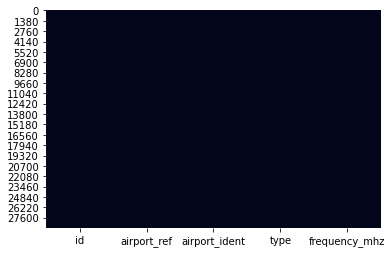

In [44]:
sns.heatmap(data_one.isnull(), cbar=False)

<AxesSubplot:>

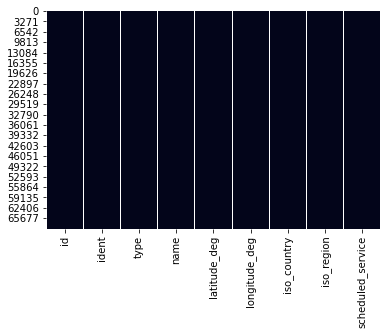

In [45]:
sns.heatmap(data_two.isnull(), cbar=False)

<AxesSubplot:>

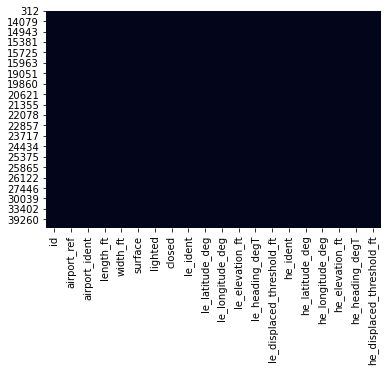

In [46]:
sns.heatmap(data_three.isnull(), cbar=False)

## **Converting the First Dataset to JSON**

In [47]:
data_one.to_json(r'data_one.json')


In [48]:
result_one = data_one.to_json(orient="split")


In [49]:
parsed_one = json.loads(result_one)


In [50]:
json.dumps(parsed_one, indent= None)  

'{"columns": ["id", "airport_ref", "airport_ident", "type", "frequency_mhz"], "index": [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 20

# Converting the Second Dataset to JSON

In [51]:
data_two.to_json(r'data_two.json')


In [52]:
result_two = data_two.to_json(orient = "split")

In [53]:
parsed_two = json.loads(result_two)


In [54]:
json.dumps(parsed_two, indent= None)  

'{"columns": ["id", "ident", "type", "name", "latitude_deg", "longitude_deg", "iso_country", "iso_region", "scheduled_service"], "index": [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 1

## **Converting the Third Dataset to JSON**

In [55]:
data_three.to_json(r'data_three.json')

In [56]:
result_three = data_three.to_json(orient = "split")

In [57]:
parsed_three = json.loads(result_three)


In [58]:
json.dumps(parsed_three, indent= None)  

'{"columns": ["id", "airport_ref", "airport_ident", "length_ft", "width_ft", "surface", "lighted", "closed", "le_ident", "le_latitude_deg", "le_longitude_deg", "le_elevation_ft", "le_heading_degT", "le_displaced_threshold_ft", "he_ident", "he_latitude_deg", "he_longitude_deg", "he_elevation_ft", "he_heading_degT", "he_displaced_threshold_ft"], "index": [312, 395, 762, 2349, 3207, 3730, 4213, 4356, 4398, 4782, 5129, 5459, 5504, 5534, 6996, 7040, 7041, 9815, 10429, 10676, 10917, 11634, 11888, 11894, 11921, 12267, 12283, 12284, 12288, 12477, 12723, 12832, 13235, 13246, 13311, 13609, 13809, 13811, 13840, 13885, 13890, 13933, 13938, 13998, 14029, 14055, 14079, 14080, 14121, 14166, 14173, 14212, 14213, 14228, 14240, 14257, 14280, 14284, 14338, 14339, 14373, 14533, 14561, 14563, 14564, 14718, 14719, 14720, 14722, 14723, 14735, 14736, 14737, 14753, 14767, 14775, 14791, 14797, 14800, 14804, 14835, 14860, 14865, 14866, 14876, 14877, 14878, 14895, 14897, 14925, 14926, 14934, 14943, 14953, 14963, 

In [59]:
df = pd.read_json (r'data_one.json')
df.to_csv (r'data_one.csv', index = None)

In [60]:
df_two = pd.read_json (r'data_two.json')
df_two.to_csv (r'data_two.csv', index = None)

In [61]:
df_three = pd.read_json (r'data_three.json')
df_three.to_csv (r'data_three.csv', index = None)

In [62]:
data_one = pd.read_csv("data_one.csv")

In [63]:
data_two = pd.read_csv("data_two.csv")

In [64]:
data_three = pd.read_csv("data_three.csv")

In [65]:
data_one.head(5)

,id,airport_ref,airport_ident,type,frequency_mhz
0,70518,6528,00CA,CTAF,122.9
1,307581,6589,01FL,ARCAL,122.9
2,75239,6589,01FL,CTAF,122.8
3,60191,6756,04CA,CTAF,122.9
4,59287,6779,04MS,UNIC,122.8


In [66]:
data_two.head(5)

,id,ident,type,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service
0,6523,00A,heliport,Total Rf Heliport,40.070801,-74.933601,US,US-PA,no
1,323361,00AA,small_airport,Aero B Ranch Airport,38.704022,-101.473911,US,US-KS,no
2,6524,00AK,small_airport,Lowell Field,59.947733,-151.692524,US,US-AK,no
3,6525,00AL,small_airport,Epps Airpark,34.864799,-86.770302,US,US-AL,no
4,6526,00AR,closed,Newport Hospital & Clinic Heliport,35.608700,-91.254898,US,US-AR,no


In [67]:
data_three.head(5)

,id,airport_ref,airport_ident,length_ft,width_ft,surface,lighted,closed,le_ident,le_latitude_deg,le_longitude_deg,le_elevation_ft,le_heading_degT,le_displaced_threshold_ft,he_ident,he_latitude_deg,he_longitude_deg,he_elevation_ft,he_heading_degT,he_displaced_threshold_ft
0,253744,6802,04W,2751,75,ASPH-G,1,0,06,46.0213,-92.9001,1021,66.0,190,24,46.0244,-92.8902,1009,246.0,394
1,245598,6868,06FA,7003,150,ASPH,1,0,09,26.9081,-80.3392,28,90.0,241,27,26.9082,-80.3177,28,270.0,241
2,254904,7200,0I2,2941,40,ASPH-G,1,0,09,39.4768,-87.1049,645,91.0,620,27,39.4767,-87.0945,631,271.0,442
3,254282,8656,1T8,2890,40,ASPH-F,1,0,16,29.7430,-98.4519,1080,149.0,490,34,29.7430,-98.4519,1080,329.0,200
4,256390,9368,2D7,3175,115,TURF-G,1,0,10,40.6468,-81.5618,984,92.0,425,28,40.6465,-81.5504,972,272.0,734


## **Outputs should not include any data from airports that have a ‘type’ ‘closed**

In [68]:
#data_two.drop(data_two[data_two['type'] == "closed"], inplace=True)
data_two.drop(data_two.index[data_two['type'] == 'closed'], inplace = True)

In [69]:

data_two.tail(5)

,id,ident,type,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service
68684,32753,ZYYY,medium_airport,Shenyang Dongta Airport,41.784401,123.496002,CN,CN-21,no
68685,46378,ZZ-0001,heliport,Sealand Helipad,51.894444,1.482500,GB,GB-ENG,no
68686,307326,ZZ-0002,small_airport,Glorioso Islands Airstrip,-11.584278,47.296389,TF,TF-U-A,no
68687,346788,ZZ-0003,small_airport,Fainting Goat Airport,32.110587,-97.356312,US,US-TX,no
68689,313629,ZZZZ,small_airport,Satsuma Iōjima Airport,30.784722,130.270556,JP,JP-46,no


## **Preprocessing Steps**

In [70]:
data_two.shape

(60464, 9)

In [71]:
#Grouping and perform count over each group
data_two_g =  data_two.groupby('type')['type'].count()

In [72]:
data_two_g

type
balloonport          36
heliport          16799
large_airport       623
medium_airport     4545
seaplane_base      1096
small_airport     37365
Name: type, dtype: int64

In [73]:
#Grouping and perform count over each group
data_two_g =  data_two.groupby('iso_country')['iso_country'].count()

In [74]:
data_two_g

iso_country
AD      2
AE    121
AF     73
AG      3
AI      1
     ... 
YE     31
YT      1
ZA    560
ZM    102
ZW    139
Name: iso_country, Length: 243, dtype: int64

In [75]:
data_two.head()

,id,ident,type,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service
0,6523,00A,heliport,Total Rf Heliport,40.070801,-74.933601,US,US-PA,no
1,323361,00AA,small_airport,Aero B Ranch Airport,38.704022,-101.473911,US,US-KS,no
2,6524,00AK,small_airport,Lowell Field,59.947733,-151.692524,US,US-AK,no
3,6525,00AL,small_airport,Epps Airpark,34.864799,-86.770302,US,US-AL,no
5,322127,00AS,small_airport,Fulton Airport,34.942803,-97.818019,US,US-OK,no


In [76]:
data_two_upd = data_two.index[data_two['iso_country'] == 'UK']

In [77]:
data_two_upd

Int64Index([], dtype='int64')

In [78]:
data_two.groupby(["type", "name"])["iso_country"].count()

type           name                     
balloonport    Aeronut Park Balloonport     1
               Alba Vineyard Balloonport    1
               Anthony Balloonport          1
               Aurora Balloonport           1
               Balloon Fiesta Park          1
                                           ..
small_airport  Žatec-Macerka Airfield       1
               Žeimelis Airstrip            1
               Želeč Airstrip               1
               Želiezovce                   1
               Žocenes lidlauks             1
Name: iso_country, Length: 57674, dtype: int64

## **The ‘type’ column contains information of the type of airport. Extract this out into a new column, one for each category of airport, for: • all UK(GB) airports, that are , large_airport, medium_airport, small airport • join each category, large_airport, medium_airport, small airport **

In [79]:
data_two_new = data_two[data_two["iso_country"] == "GB"]

In [80]:
#data_two.drop(data_two[data_two['type'] == "closed"], inplace=True)
data_two_new.drop(data_two_new.index[data_two_new['type'] == 'balloonport'], inplace = True)

In [81]:
data_two_new.drop(data_two_new.index[data_two_new['type'] == 'heliport'], inplace = True)

In [82]:
data_two_new.drop(data_two_new.index[data_two_new['type'] == 'seaplane_base'], inplace = True)

In [83]:
data_two_new[data_two_new["iso_country"] == "GB"]

,id,ident,type,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service
15947,314749,Cark,small_airport,Cark airfield,54.163753,-2.962299,GB,GB-ENG,no
20860,307538,EG03,small_airport,Badminton Airfield,51.548417,-2.303181,GB,GB-ENG,no
20861,307747,EG19,small_airport,Boon Hill Farm Airstrip,54.308086,-0.983105,GB,GB-ENG,no
20862,35134,EG34,small_airport,Ledbury Airfield,52.001900,-2.474160,GB,GB-ENG,no
20863,308207,EG3L,small_airport,Milfield Glider Field,55.591636,-2.087231,GB,GB-ENG,no
...,...,...,...,...,...,...,...,...,...
25503,32175,GB-PSV,small_airport,Papa Stour Airport,60.321701,-1.693060,GB,GB-SCT,yes
25504,29640,GB-ULL,small_airport,Glenforsa Airfield,56.517502,-5.914170,GB,GB-SCT,no
37024,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no
66062,41918,XBRO,small_airport,Broadford Airstrip,57.253399,-5.827900,GB,GB-SCT,no


In [84]:
data_two_new.shape

(1016, 9)

In [85]:
data_one.head()

,id,airport_ref,airport_ident,type,frequency_mhz
0,70518,6528,00CA,CTAF,122.9
1,307581,6589,01FL,ARCAL,122.9
2,75239,6589,01FL,CTAF,122.8
3,60191,6756,04CA,CTAF,122.9
4,59287,6779,04MS,UNIC,122.8


In [86]:
data_one.groupby('airport_ident')['airport_ident'].count()

airport_ident
00CA    1
01FL    2
04CA    1
04MS    1
04NV    1
       ..
csv8    1
cvb2    2
cwf2    1
lhkk    2
lrpv    1
Name: airport_ident, Length: 10592, dtype: int64

In [87]:
data_three

,id,airport_ref,airport_ident,length_ft,width_ft,surface,lighted,closed,le_ident,le_latitude_deg,le_longitude_deg,le_elevation_ft,le_heading_degT,le_displaced_threshold_ft,he_ident,he_latitude_deg,he_longitude_deg,he_elevation_ft,he_heading_degT,he_displaced_threshold_ft
0,253744,6802,04W,2751,75,ASPH-G,1,0,06,46.0213,-92.9001,1021,66.0,190,24,46.0244,-92.8902,1009,246.0,394
1,245598,6868,06FA,7003,150,ASPH,1,0,09,26.9081,-80.3392,28,90.0,241,27,26.9082,-80.3177,28,270.0,241
2,254904,7200,0I2,2941,40,ASPH-G,1,0,09,39.4768,-87.1049,645,91.0,620,27,39.4767,-87.0945,631,271.0,442
3,254282,8656,1T8,2890,40,ASPH-F,1,0,16,29.7430,-98.4519,1080,149.0,490,34,29.7430,-98.4519,1080,329.0,200
4,256390,9368,2D7,3175,115,TURF-G,1,0,10,40.6468,-81.5618,984,92.0,425,28,40.6465,-81.5504,972,272.0,734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
954,233268,27145,YSSY,7999,148,ASP,1,0,16L,-33.9496,151.1880,16,168.0,758,34R,-33.9711,151.1940,13,348.0,125
955,310584,310582,ZA-0113,3100,30,Gravel,0,0,08,-26.8536,28.1942,4944,56.0,100,26,-26.8491,28.2020,4996,236.0,100
956,237554,27207,ZMBU,7217,164,BIT,0,0,18,46.6700,113.2830,3159,172.1,983,36,46.6507,113.2870,3094,352.1,983
957,235202,27215,ZSAM,11155,148,ASP,1,0,05,24.5346,118.1150,56,53.0,490,23,24.5534,118.1410,36,233.0,660


In [88]:
data_two_new

,id,ident,type,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service
15947,314749,Cark,small_airport,Cark airfield,54.163753,-2.962299,GB,GB-ENG,no
20860,307538,EG03,small_airport,Badminton Airfield,51.548417,-2.303181,GB,GB-ENG,no
20861,307747,EG19,small_airport,Boon Hill Farm Airstrip,54.308086,-0.983105,GB,GB-ENG,no
20862,35134,EG34,small_airport,Ledbury Airfield,52.001900,-2.474160,GB,GB-ENG,no
20863,308207,EG3L,small_airport,Milfield Glider Field,55.591636,-2.087231,GB,GB-ENG,no
...,...,...,...,...,...,...,...,...,...
25503,32175,GB-PSV,small_airport,Papa Stour Airport,60.321701,-1.693060,GB,GB-SCT,yes
25504,29640,GB-ULL,small_airport,Glenforsa Airfield,56.517502,-5.914170,GB,GB-SCT,no
37024,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no
66062,41918,XBRO,small_airport,Broadford Airstrip,57.253399,-5.827900,GB,GB-SCT,no


## **To the communication frequencies ‘ frequency_mhz’ that the airport uses for communication ensuring that each airport in all categories is correctly matched with its communication frequencies** 

In [89]:
data_two_new.rename(columns = {'id':'airport_ref'}, inplace = True)


In [90]:
data_two_new

,airport_ref,ident,type,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service
15947,314749,Cark,small_airport,Cark airfield,54.163753,-2.962299,GB,GB-ENG,no
20860,307538,EG03,small_airport,Badminton Airfield,51.548417,-2.303181,GB,GB-ENG,no
20861,307747,EG19,small_airport,Boon Hill Farm Airstrip,54.308086,-0.983105,GB,GB-ENG,no
20862,35134,EG34,small_airport,Ledbury Airfield,52.001900,-2.474160,GB,GB-ENG,no
20863,308207,EG3L,small_airport,Milfield Glider Field,55.591636,-2.087231,GB,GB-ENG,no
...,...,...,...,...,...,...,...,...,...
25503,32175,GB-PSV,small_airport,Papa Stour Airport,60.321701,-1.693060,GB,GB-SCT,yes
25504,29640,GB-ULL,small_airport,Glenforsa Airfield,56.517502,-5.914170,GB,GB-SCT,no
37024,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no
66062,41918,XBRO,small_airport,Broadford Airstrip,57.253399,-5.827900,GB,GB-SCT,no


In [91]:
data_one

,id,airport_ref,airport_ident,type,frequency_mhz
0,70518,6528,00CA,CTAF,122.900
1,307581,6589,01FL,ARCAL,122.900
2,75239,6589,01FL,CTAF,122.800
3,60191,6756,04CA,CTAF,122.900
4,59287,6779,04MS,UNIC,122.800
...,...,...,...,...,...
28957,51248,27242,ZYTL,TWR,118.250
28958,341318,27243,ZYTX,APPR,119.825
28959,51243,27243,ZYTX,ATIS,127.450
28960,51244,27243,ZYTX,TWR,118.100


In [92]:
data_final = pd.merge(data_two_new, data_one, how='inner', on = 'airport_ref')


In [93]:
data_final

,airport_ref,ident,type_x,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service,id,airport_ident,type_y,frequency_mhz
0,314749,Cark,small_airport,Cark airfield,54.163753,-2.962299,GB,GB-ENG,no,314751,Cark,CTAF(R),129.900
1,307538,EG03,small_airport,Badminton Airfield,51.548417,-2.303181,GB,GB-ENG,no,307717,EG03,A/G,123.175
2,28473,EG64,small_airport,Rufforth West,53.948290,-1.185575,GB,GB-ENG,no,316822,EG64,Info,129.975
3,3075,EG74,small_airport,Bruntingthorpe Airport,52.492972,-1.125090,GB,GB-ENG,no,58426,EG74,A/G,122.825
4,2385,EGAA,large_airport,Belfast International Airport,54.657501,-6.215830,GB,GB-NIR,yes,58151,EGAA,APP,128.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...
685,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no,51695,LCRA,DIR,122.100
686,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no,51696,LCRA,GND,26.100
687,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no,51697,LCRA,OPS,23.405
688,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no,51698,LCRA,TWR,122.100


In [94]:
data_final.columns

Index(['airport_ref', 'ident', 'type_x', 'name', 'latitude_deg',
       'longitude_deg', 'iso_country', 'iso_region', 'scheduled_service', 'id',
       'airport_ident', 'type_y', 'frequency_mhz'],
      dtype='object')

The client initially needs information to generate the following and output the results using appropriate representation:

• Produce the mean, mode and median for the 

• For large_airport

• For frequencies more than 100 mhz

In [95]:
data_final["type_x"].value_counts()

medium_airport    385
small_airport     196
large_airport     109
Name: type_x, dtype: int64

In [96]:
data_final_upd = data_final.index[data_final['type_x'] == 'large_airport']

In [97]:
data_final_upd

Int64Index([  4,   5,   6,   7,   8,   9,  10,  11,  20,  21,
            ...
            414, 415, 416, 417, 683, 684, 685, 686, 687, 688],
           dtype='int64', length=109)

In [98]:
data_final_new = data_final[data_final["type_x"] == "large_airport"]

In [99]:
data_final_new

,airport_ref,ident,type_x,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service,id,airport_ident,type_y,frequency_mhz
4,2385,EGAA,large_airport,Belfast International Airport,54.657501,-6.21583,GB,GB-NIR,yes,58151,EGAA,APP,128.500
5,2385,EGAA,large_airport,Belfast International Airport,54.657501,-6.21583,GB,GB-NIR,yes,58152,EGAA,ATIS,128.200
6,2385,EGAA,large_airport,Belfast International Airport,54.657501,-6.21583,GB,GB-NIR,yes,58153,EGAA,GND,121.750
7,2385,EGAA,large_airport,Belfast International Airport,54.657501,-6.21583,GB,GB-NIR,yes,308372,EGAA,ILS 17,110.900
8,2385,EGAA,large_airport,Belfast International Airport,54.657501,-6.21583,GB,GB-NIR,yes,308371,EGAA,ILS 25,109.900
...,...,...,...,...,...,...,...,...,...,...,...,...,...
684,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.98790,GB,GB-U-A,no,51694,LCRA,ATIS,28.820
685,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.98790,GB,GB-U-A,no,51695,LCRA,DIR,122.100
686,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.98790,GB,GB-U-A,no,51696,LCRA,GND,26.100
687,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.98790,GB,GB-U-A,no,51697,LCRA,OPS,23.405


## **Mean**

In [100]:
data_final_new[["frequency_mhz"]].mean()

frequency_mhz    120.007523
dtype: float64

## **Median**

In [101]:
data_final_new[["frequency_mhz"]].median()

frequency_mhz    121.85
dtype: float64

## **Mode**

In [102]:
data_final_new[["frequency_mhz"]].mode()

,frequency_mhz
0,121.75
1,122.10


In [103]:
df_frequency = data_final_new.groupby("type_x").agg([np.mean, np.std, np.median])

In [104]:

Frequency = df_frequency["frequency_mhz"]
 
# checking for results
Frequency.head()



,mean,std,median
type_x,,,
large_airport,120.007523,19.374093,121.85


In [105]:
Frequency = Frequency.reset_index(drop=True)


In [106]:
Frequency.to_csv("outputsfreequcny.csv")

<AxesSubplot:>

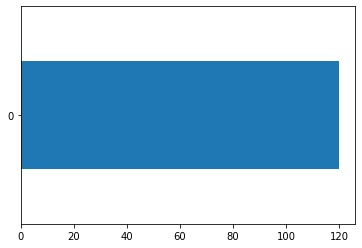

In [107]:
Frequency.plot(kind = "barh", y = "mean", legend = False)

<AxesSubplot:>

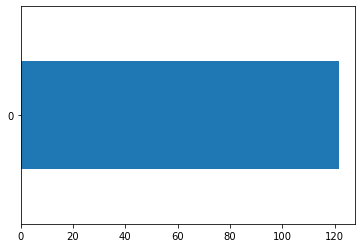

In [108]:
Frequency.plot(kind = "barh", y = "median", legend = False)

<AxesSubplot:>

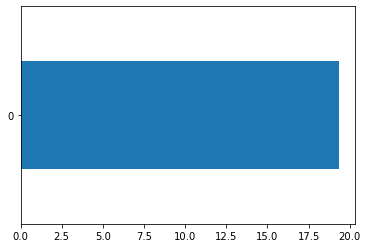

In [109]:
Frequency.plot(kind = "barh", y = "std", legend = False)

## **For frequencies more than 100 mhz**

In [110]:
data_final_new_new = data_final[data_final["frequency_mhz"] > 100]

In [111]:
data_final_new_new


,airport_ref,ident,type_x,name,latitude_deg,longitude_deg,iso_country,iso_region,scheduled_service,id,airport_ident,type_y,frequency_mhz
0,314749,Cark,small_airport,Cark airfield,54.163753,-2.962299,GB,GB-ENG,no,314751,Cark,CTAF(R),129.900
1,307538,EG03,small_airport,Badminton Airfield,51.548417,-2.303181,GB,GB-ENG,no,307717,EG03,A/G,123.175
2,28473,EG64,small_airport,Rufforth West,53.948290,-1.185575,GB,GB-ENG,no,316822,EG64,Info,129.975
3,3075,EG74,small_airport,Bruntingthorpe Airport,52.492972,-1.125090,GB,GB-ENG,no,58426,EG74,A/G,122.825
4,2385,EGAA,large_airport,Belfast International Airport,54.657501,-6.215830,GB,GB-NIR,yes,58151,EGAA,APP,128.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...
682,29640,GB-ULL,small_airport,Glenforsa Airfield,56.517502,-5.914170,GB,GB-SCT,no,307570,GB-ULL,A/G,128.800
683,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no,51693,LCRA,APP,122.100
685,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no,51695,LCRA,DIR,122.100
688,3982,LCRA,large_airport,RAF Akrotiri,34.590401,32.987900,GB,GB-U-A,no,51698,LCRA,TWR,122.100


## **Mean**

In [112]:
data_final_new_new[["frequency_mhz"]].mean()

frequency_mhz    149.241253
dtype: float64

## **Median**

In [113]:
data_final_new_new[["frequency_mhz"]].median()

frequency_mhz    124.4
dtype: float64

## **Mode**

In [114]:
data_final_new_new[["frequency_mhz"]].mode()

,frequency_mhz
0,122.1


In [115]:
df_frequency = data_final_new_new.groupby("type_x").agg([np.mean, np.std, np.median])

In [116]:

Frequency = df_frequency["frequency_mhz"]
 
# checking for results
Frequency.head()


,mean,std,median
type_x,,,
large_airport,123.581095,6.189527,121.900
medium_airport,167.817545,86.637667,125.875
small_airport,129.802617,25.772714,124.375


In [117]:
Frequency.to_csv("100mhz.csv")

In [118]:
Frequency.head()


,mean,std,median
type_x,,,
large_airport,123.581095,6.189527,121.900
medium_airport,167.817545,86.637667,125.875
small_airport,129.802617,25.772714,124.375


<AxesSubplot:xlabel='type_x'>

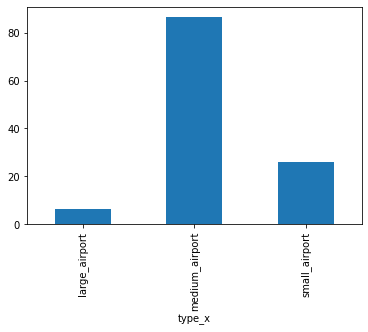

In [119]:
Frequency.plot(kind = "bar", y = "std", legend = False)

<AxesSubplot:xlabel='type_x'>

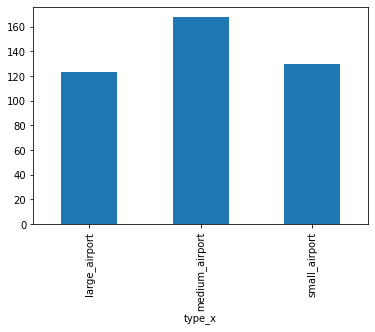

In [120]:
Frequency.plot(kind = "bar", y = "mean", legend = False)

<AxesSubplot:xlabel='type_x'>

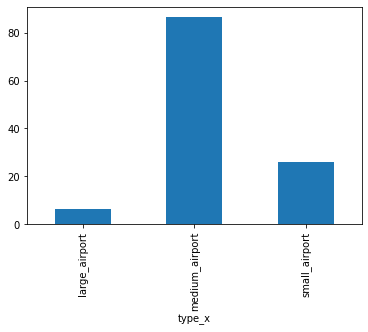

In [121]:
Frequency.plot(kind = "bar", y = "std", legend = False)

## **Produce a suitable graph that display the communication frequencies used by ‘small_airport’ You may need to consider how you group this data to make visualisation feasible **

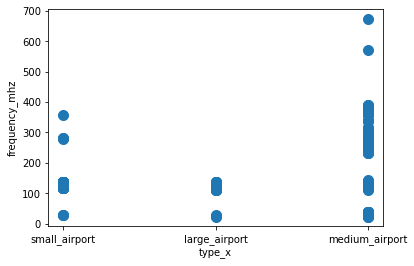

In [122]:
data_final.plot.scatter(x = 'type_x', y = 'frequency_mhz', s = 100);

In [123]:
data_final_new = data_final[data_final["type_x"] == "small_airport"]

In [124]:
df_frequency = data_final_new.groupby("type_x").agg([np.mean, np.std, np.median])

In [125]:

Frequency = df_frequency["frequency_mhz"]
 
# checking for results
Frequency.head()

,mean,std,median
type_x,,,
small_airport,128.251321,28.454036,124.2125


In [126]:
Frequency = Frequency.reset_index(drop=True)


In [127]:
Frequency.head()

,mean,std,median
0,128.251321,28.454036,124.2125


In [128]:
Frequency.set_index('mean')

,std,median
mean,,
128.251321,28.454036,124.2125


In [129]:
Frequency.to_csv("smallairportsnew.csv")

<AxesSubplot:>

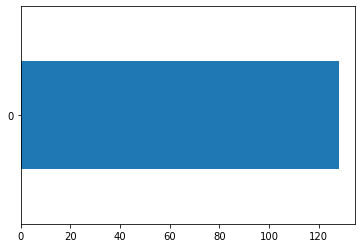

In [130]:
Frequency.plot(kind = "barh", y = "mean", legend = False)

<AxesSubplot:>

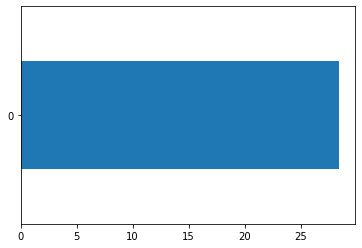

In [131]:
Frequency.plot(kind = "barh", y = "std", legend = False)

<AxesSubplot:>

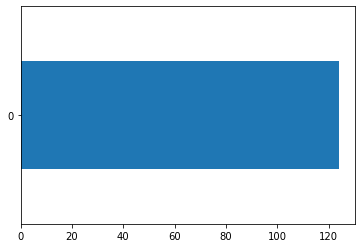

In [132]:
Frequency.plot(kind = "barh", y = "median", legend = False)

Determine if there is any significant correlation between the communication frequencies used by the 3 different categories of airport. ‘Are some frequencies used more than
others?’. You will need to select an appropriate visualisation to demonstrate this. 

In [133]:
data_final_large = data_final[data_final["type_x"] == "large_airport"]

In [134]:

data_final_large.shape

(109, 13)

In [135]:
data_final_small = data_final[data_final["type_x"] == "small_airport"]

In [136]:
data_final_small = data_final_small.iloc[0:109, :]

In [137]:
data_final_small.shape

(109, 13)

In [138]:
data_final_medium = data_final[data_final["type_x"] == "medium_airport"]

In [139]:
data_final_medium = data_final_medium.iloc[0:109, :]

<AxesSubplot:xlabel='frequency_mhz', ylabel='frequency_mhz'>

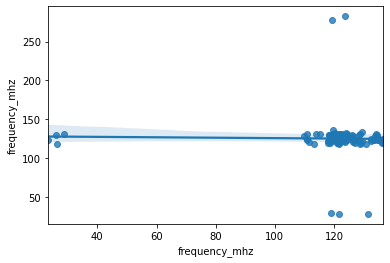

In [140]:
import seaborn as sns

sns.regplot(x=data_final_large["frequency_mhz"], y=data_final_small["frequency_mhz"])

<AxesSubplot:xlabel='frequency_mhz', ylabel='frequency_mhz'>

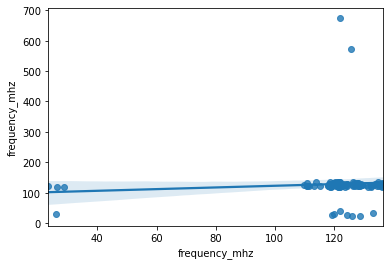

In [141]:

sns.regplot(x=data_final_large["frequency_mhz"], y=data_final_medium["frequency_mhz"])

<AxesSubplot:xlabel='frequency_mhz', ylabel='frequency_mhz'>

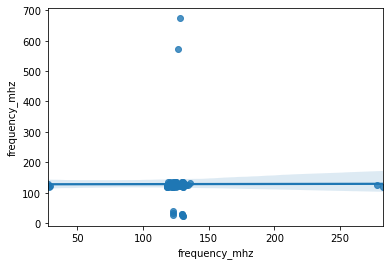

In [142]:
sns.regplot(x=data_final_small["frequency_mhz"], y=data_final_medium["frequency_mhz"])

# GUI CODE

In [143]:
class GUI_CODE(QMainWindow):

    def __init__(self):
        super().__init__()
        #self.MainWindow = MainWindow
        #self.setupUi()
        self.initUI()

    def initUI(self):
        self.setWindowTitle('Prototype Application')

        # window_width = GetSystemMetrics(0)
        # window_height = GetSystemMetrics(1)
        window_width = 1000
        window_height = 700

        self.resize(0.9 * window_width, 0.9 * window_height)
        self.center()

        self.setWindowIcon(QIcon('Icon.png'))

        #inits
        self.openDirectoryDialog = ""
        self.data = np.empty(shape=(1,2), dtype=np.float)

        #Exit on menubar
        exitAct = QAction('&Exit', self)
        exitAct.setShortcut('Ctrl+Q')
        exitAct.setStatusTip('Exit applicatiion')
        exitAct.triggered.connect(qApp.quit)

        #Open on menubar
        openAct = QAction('&Open', self)
        openAct.setShortcut('Ctrl+O')
        openAct.setStatusTip('Open Directory')
        #openAct.triggered.connect(self.openFile)
        openAct.triggered.connect(self.openFile)
        openAct.triggered.connect(self.openFile1)
        openAct.triggered.connect(self.openFile2)

        #menubar
        menubar = self.menuBar()
        fileMenu = menubar.addMenu('&File')
        fileMenu.addAction(exitAct)
        fileMenu.addAction(openAct)


        #Central
        centralwidget = QWidget(self)
        self.setCentralWidget(centralwidget)

        #Grid
        grid = QGridLayout(centralwidget)
        self.setLayout(grid)

        #Plot
        plotCan = PlotCanvas(self, width=2, height=2)
        grid.addWidget(plotCan , 0,3)
        # plotCan2 = PlotCanvas2(self, width=2, height=2)
        # grid.addWidget(plotCan2 , 0,3)
        
     
        #button
        btn = QPushButton("Create Visualization", centralwidget)
        btn.resize(btn.sizeHint())
        btn1 = QPushButton("Translate Data", centralwidget)
        btn1.resize(btn1.sizeHint())
        btn2 = QPushButton("Upload Data", centralwidget)
        btn2.resize(btn2.sizeHint())
        grid.addWidget(btn, 0,2)
        grid.addWidget(btn2, 0,1)        
        grid.addWidget(btn1, 0,0)
        btn.clicked.connect(lambda: plotCan.plot(self.data))
        #btn.clicked.connect(plotCan .plot(self.data))
        # btn.clicked.connect(lambda: plotCan2.plot(self.data))
        #btn1.clicked.connect(lambda: openFiles.print(self.data))
        #selectImg_btn = QPushButton(centralwidget)
        #selectImg_btn.setObjectName("selectImg_btn")
        #selectImg_btn.clicked.connect(self.loadImage)
        #btn.clicked.connect(self.openFile2)
        btn2.clicked.connect(self.openFile)
        btn2.clicked.connect(self.openFile1)
        btn2.clicked.connect(self.openFile2)

        self.show()


        self.show()

    def center(self):
        qr = self.frameGeometry()
        cp = QDesktopWidget().availableGeometry().center()
        qr.moveCenter(cp)
        self.move(qr.topLeft())

    def openFile(self):
        #self.csvFile = QFileDialog.getOpenFileName(self, "Get Dir Path")[0]
        options = QFileDialog.Options()
        options |= QFileDialog.DontUseNativeDialog
        fileName, _ = QFileDialog.getOpenFileName(self,"Choose File", "","csv (*.csv)", 
        options=options)
        data_one = pd.read_csv(fileName)
        data_one.drop("description", axis=1, inplace=True)
        data_one.dropna(inplace = True)
        data_one.to_json(r'data_one.json')
        result_one = data_one.to_json(orient="split")
        parsed_one = json.loads(result_one)
        json.dumps(parsed_one, indent= None)  
        df = pd.read_json (r'data_one.json')
        df.to_csv (r'data_one.csv', index = None)
        data_one = pd.read_csv("data_one.csv")
      

    def openFile1(self):
        options = QFileDialog.Options()
        options |= QFileDialog.DontUseNativeDialog
        fileName, _ = QFileDialog.getOpenFileName(self,"Choose File", "","csv (*.csv)", 
        options=options)
        data_two =pd.read_csv(fileName)
        data_two.drop(["keywords", "wikipedia_link", "home_link", "local_code", "local_code", "iata_code", "gps_code", "continent", "elevation_ft", "municipality"], axis=1, inplace=True)
        data_two.dropna(inplace = True)
        data_two.to_json(r'data_two.json')
        result_two = data_two.to_json(orient = "split")
        parsed_two = json.loads(result_two)
        json.dumps(parsed_two, indent= None)  
        df_two = pd.read_json (r'data_two.json')
        df_two.to_csv (r'data_two.csv', index = None)
        data_two = pd.read_csv("data_two.csv")
        data_two.drop(data_two.index[data_two['type'] == 'closed'], inplace = True)
        #The ‘type’ column contains information of the type of airport. 
        #Extract this out into a new column, one for each category of airport,
        #for: • all UK(GB) airports, that are , large_airport, medium_airport, 
        #small airport • join each category, large_airport, medium_airport, small airport 
        data_two_new = data_two[data_two["iso_country"] == "GB"]
        data_two_new.drop(data_two_new.index[data_two_new['type'] == 'balloonport'], inplace = True)
        data_two_new.drop(data_two_new.index[data_two_new['type'] == 'heliport'], inplace = True)
        data_two_new.drop(data_two_new.index[data_two_new['type'] == 'seaplane_base'], inplace = True)
        data_two_new[data_two_new["iso_country"] == "GB"]
        #To the communication frequencies ‘ frequency_mhz’ that the airport 
        #uses for communication ensuring that each airport in all categories is 
        #correctly matched with its communication frequencies      
        data_two_new.rename(columns = {'id':'airport_ref'}, inplace = True)
        data_one = pd.read_csv("data_one.csv")
        data_final = pd.merge(data_two_new, data_one, how='inner', on = 'airport_ref')
        #The client initially needs information to generate the following and output the results using appropriate representation:
        #Produce the mean, mode and median for the
        #For large_airport
        #For frequencies more than 100 mhz
        
        data_final_new = data_final[data_final["type_x"] == "large_airport"]
        df_frequency = data_final_new.groupby("type_x").agg([np.mean, np.std, np.median])
        Frequency = df_frequency["frequency_mhz"]
        
        data_final_new_new = data_final[data_final["frequency_mhz"] > 100]
        df_frequency = data_final_new_new.groupby("type_x").agg([np.mean, np.std, np.median])
        Frequency1 = df_frequency["frequency_mhz"]
        Frequency.to_csv("outputsfreequcny.csv", index = None)
        Frequency1.to_csv("new100mhz.csv", index = None)
        #Produce a suitable graph that display the communication frequencies used by
        #‘small_airport’ You may need to consider how you group this data to make visualisation
        #feasible
        
        data_final_new = data_final[data_final["type_x"] == "small_airport"]
        df_frequency = data_final_new.groupby("type_x").agg([np.mean, np.std, np.median])
        Frequency = df_frequency["frequency_mhz"]
        Frequency = Frequency.reset_index(drop=True)
        Frequency.set_index('mean')
        Frequency.to_csv("smallairportsnews.csv")
        
    def openFile2(self):
        #self.csvFile = QFileDialog.getOpenFileName(self, "Get Dir Path")[0]
        options = QFileDialog.Options()
        options |= QFileDialog.DontUseNativeDialog
        fileName, _ = QFileDialog.getOpenFileName(self,"Choose File", "","csv (*.csv)", 
        options=options)
        data_three = pd.read_csv(fileName)
        data_three.dropna(inplace = True)
        data_three.to_json(r'data_three.json')
        result_three = data_three.to_json(orient="split")
        parsed_three = json.loads(result_three)
        json.dumps(parsed_three, indent= None)  
        df_three = pd.read_json (r'data_three.json')
        df_three.to_csv (r'data_three.csv', index = None)
        data_threee = pd.read_csv("data_three.csv")

    def buttonpress(self):
        self.plot(self.data)
    
   




In [144]:

class PlotCanvas(FigureCanvas):

    def __init__(self, parent=None, width=5, height=4, dpi=100):
        # fig = Figure(figsize=(width, height), dpi=dpi)
        fig, axes =plt.subplots(2,2)
        fig.set_figwidth(width)
        fig.set_figheight(height)
        self.axes = axes
        # self.axes = fig.add_subplot(111)

        FigureCanvas.__init__(self, fig)
        self.setParent(parent)

        FigureCanvas.setSizePolicy(self,
                QSizePolicy.Expanding,
                QSizePolicy.Expanding)
        FigureCanvas.updateGeometry(self)

    def plot(self, data = np.empty(shape=(1,2))):

        #df = pd.read_csv('out_freq.csv')
        df = pd.read_csv('outputsfreequcny.csv')
        #df.drop("Unnamed: 0", axis = 1, inplace = True)

        x_axis = list(df.columns)
        y_axis = list(df.to_numpy()[0])


        df1 = pd.read_csv('smallairportsnews.csv')
        df1.drop("Unnamed: 0", axis = 1, inplace = True)
        
        x1_axis = list(df1.columns)
        y1_axis = list(df1.to_numpy()[0])        
        

        df1 = pd.read_csv("100mhz.csv")
        x_axis1 = list(df1['type_x'].to_numpy())
        y_axis1 = list(df1['mean'].to_numpy())



        x_axis2 = list(df1['type_x'].to_numpy())
        y_axis2 = list(df1['median'].to_numpy())
        #x_axis3 = list(df1['type_x'].to_numpy())
        #y_axis3 = list(df1['std'].to_numpy())
        
        ((ax1,ax2),(ax3, ax4)) = self.axes
        ax1.bar(x_axis,y_axis)
        ax1.title.set_text('Large Airport')

        ax2.bar(x_axis1,y_axis1)
        ax2.title.set_text('Mean for freq > 100mhz')

        ax4.bar(x1_axis,y1_axis)
        ax4.title.set_text('Communication Frequencies Used By the Small Airport')

        ax3.bar(x_axis2,y_axis2)
        ax3.title.set_text('Median for freq > 100mhz')
        
        # plt.show()
        #sns.countplot(data[:,1])  
        self.draw()

In [145]:
class PlotCanvas2(FigureCanvas):

    def __init__(self, parent=None, width=3, height=2, dpi=100):
        fig = Figure(figsize=(width, height), dpi=dpi)
        self.axes = fig.add_subplot(111)

        FigureCanvas.__init__(self, fig)
        self.setParent(parent)

        FigureCanvas.setSizePolicy(self,
                QSizePolicy.Expanding,
                QSizePolicy.Expanding)
        FigureCanvas.updateGeometry(self)

    def plot(self, data = np.empty(shape=(1,2))):
        ax = self.figure.add_subplot(111)
        ax.plot(data[:,0],data[:,1], 'r-')
        ax.set_title('Create Visualization')
        #sns.countplot(data[:,1])
        self.draw()
   


SystemExit: 0

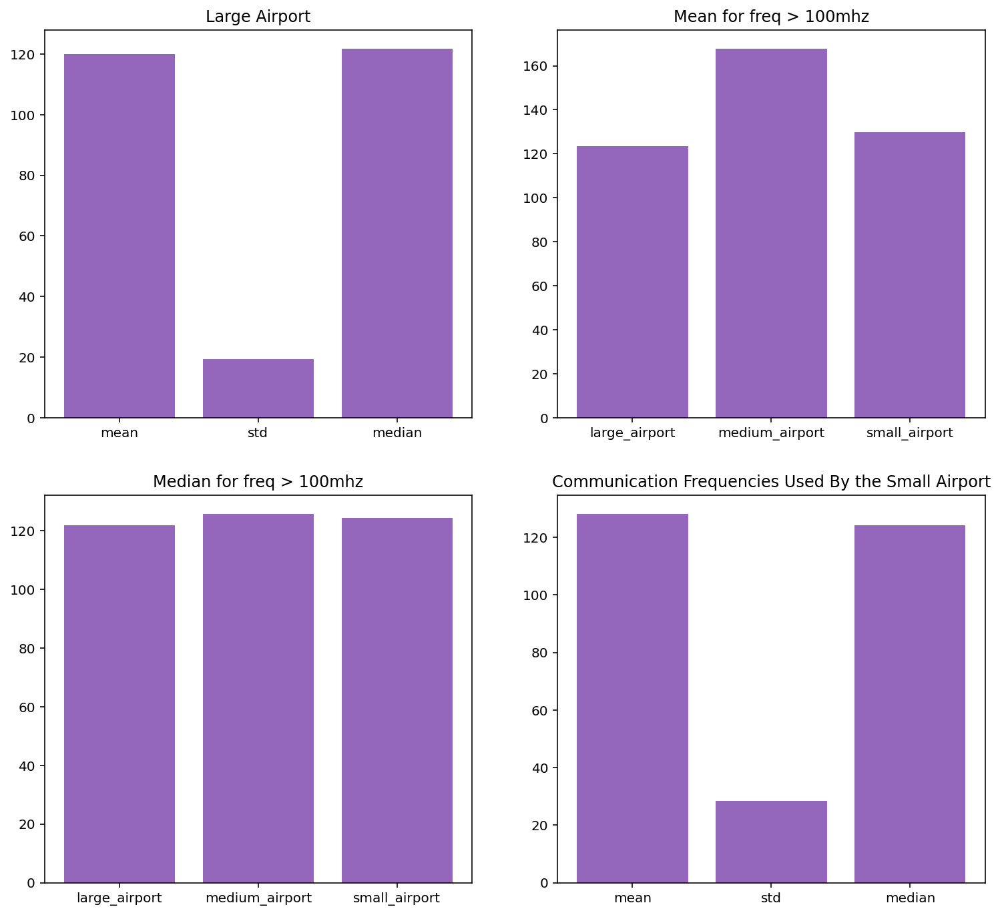

In [146]:
if __name__ == '__main__':

    app = QApplication(sys.argv)
    w = GUI_CODE()
    sys.exit(app.exec_())